# EDA project on ethereum cryptocurrency 

Given the rise of bitcoin the last several years, does the cryptocurrency ethereum also follow an upward trend. Specifically, is there more transactions and increased value in the currency since 2016 to now?

In [1]:
from google.cloud import bigquery
from google.cloud.bigquery import Dataset
from google.cloud import storage

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.pylab as pylab
import seaborn as sns

# Cause plots to be displayed in the notebook:
%pylab inline
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


In [3]:
import json

key_path = '/home/pug/data_science/DSIA/2019_12_09_DS_FT_MEL_Projects/Bryce/capstone/week-4-eda-7f7efd31ece9.json'  # put the path to your json key file here 
#,                    (or write code to load it from a file that your notebook can easily find)
try:
    auth = json.loads(open(key_path).read())
except FileNotFoundError as ex:
    print(ex)

In [4]:
storage_client = storage.Client.from_service_account_json(key_path)

In [5]:
client = bigquery.Client.from_service_account_json(key_path)

In [6]:
client.project

'week-4-eda'

In [7]:
project = 'bigquery-public-data'
client = bigquery.Client.from_service_account_json(key_path, project = project)

In [8]:
datasets = list(client.list_datasets())

In [9]:
for dataset in datasets:
    print(dataset.dataset_id)

austin_311
austin_bikeshare
austin_crime
austin_incidents
austin_waste
baseball
bitcoin_blockchain
bls
census_bureau_acs
census_bureau_construction
census_bureau_international
census_bureau_usa
census_utility
chicago_crime
chicago_taxi_trips
cloud_storage_geo_index
cms_codes
cms_medicare
cms_synthetic_patient_data_omop
crypto_bitcoin
crypto_bitcoin_cash
crypto_dash
crypto_dogecoin
crypto_ethereum
crypto_ethereum_classic
crypto_litecoin
crypto_zcash
eclipse_megamovie
epa_historical_air_quality
ethereum_blockchain
faa
fcc_political_ads
fda_drug
fda_food
fec
genomics_cannabis
genomics_rice
geo_census_blockgroups
geo_census_tracts
geo_international_ports
geo_openstreetmap
geo_us_boundaries
geo_us_census_places
geo_us_roads
geo_whos_on_first
geolite2
ghcn_d
ghcn_m
github_repos
google_analytics_sample
google_political_ads
hacker_news
human_genome_variants
human_variant_annotation
iowa_liquor_sales
irs_990
labeled_patents
libraries_io
london_bicycles
london_crime
london_fire_brigade
medicare


In [10]:
dataset_id = 'ethereum_blockchain'
dataset_ref = client.dataset(dataset_id)

In [11]:
print(dataset_ref.path)

/projects/bigquery-public-data/datasets/ethereum_blockchain


In [12]:
# function for listing tables in a dataset:
def printTableList(client, dataset_id):
    project = client.project
    dataset_ref = client.dataset(dataset_id, project = project)    
    tables = list(client.list_tables(dataset_ref))
    if tables:
        print('Tables in dataset {}:'.format(dataset_id))
        for table in tables: 
            print('\t{}'.format(table.table_id))
        found = True
    else:
        print('{} dataset does not contain any tables.'.format(dataset_id))
        found = False
    return found

In [13]:
printTableList(client,dataset_id)

Tables in dataset ethereum_blockchain:
	blocks
	contracts
	logs
	token_transfers
	tokens
	traces
	transactions


True

In [14]:
blocks_id = 'blocks'
blocks_ref = dataset_ref.table(blocks_id)
contracts_id = 'contracts'
contracts_ref = dataset_ref.table(contracts_id)
logs_id = 'logs'
logs_ref = dataset_ref.table(logs_id)
token_transfers_id = 'token_transfers'
token_transfers_ref = dataset_ref.table(token_transfers_id)
tokens_id = 'tokens'
tokens_ref = dataset_ref.table(tokens_id)
traces_id = 'traces'
traces_ref = dataset_ref.table(traces_id)
transactions_id = 'transactions'
transactions_ref = dataset_ref.table(transactions_id)

In [15]:
blocks = client.get_table(blocks_ref)
contracts = client.get_table(contracts_ref)
logs = client.get_table(logs_ref)
token_transfers = client.get_table(token_transfers_ref)
tokens = client.get_table(tokens_ref)
traces = client.get_table(traces_ref)
transactions = client.get_table(transactions_ref)

In [16]:
def printTableSchema(aTable):
    schemas = list(aTable.schema)
    if schemas:
        print('Table schema for {}:'.format(aTable.table_id))
        for aSchema in schemas:
            print('\t{0} {1}'.format(aSchema.name, aSchema.field_type))
        found = True
    else:
        found = False
    return found

In [17]:
printTableSchema(blocks)

Table schema for blocks:
	timestamp TIMESTAMP
	number INTEGER
	hash STRING
	parent_hash STRING
	nonce STRING
	sha3_uncles STRING
	logs_bloom STRING
	transactions_root STRING
	state_root STRING
	receipts_root STRING
	miner STRING
	difficulty NUMERIC
	total_difficulty NUMERIC
	size INTEGER
	extra_data STRING
	gas_limit INTEGER
	gas_used INTEGER
	transaction_count INTEGER


True

In [18]:
printTableSchema(contracts)

Table schema for contracts:
	address STRING
	bytecode STRING
	function_sighashes STRING
	is_erc20 BOOLEAN
	is_erc721 BOOLEAN
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [19]:
printTableSchema(logs)

Table schema for logs:
	log_index INTEGER
	transaction_hash STRING
	transaction_index INTEGER
	address STRING
	data STRING
	topics STRING
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [20]:
printTableSchema(token_transfers)

Table schema for token_transfers:
	token_address STRING
	from_address STRING
	to_address STRING
	value STRING
	transaction_hash STRING
	log_index INTEGER
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [21]:
printTableSchema(tokens)

Table schema for tokens:
	address STRING
	symbol STRING
	name STRING
	decimals STRING
	total_supply STRING
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [22]:
printTableSchema(traces)

Table schema for traces:
	transaction_hash STRING
	transaction_index INTEGER
	from_address STRING
	to_address STRING
	value NUMERIC
	input STRING
	output STRING
	trace_type STRING
	call_type STRING
	reward_type STRING
	gas INTEGER
	gas_used INTEGER
	subtraces INTEGER
	trace_address STRING
	error STRING
	status INTEGER
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [23]:
printTableSchema(transactions)

Table schema for transactions:
	hash STRING
	nonce INTEGER
	transaction_index INTEGER
	from_address STRING
	to_address STRING
	value NUMERIC
	gas INTEGER
	gas_price INTEGER
	input STRING
	receipt_cumulative_gas_used INTEGER
	receipt_gas_used INTEGER
	receipt_contract_address STRING
	receipt_root STRING
	receipt_status INTEGER
	block_timestamp TIMESTAMP
	block_number INTEGER
	block_hash STRING


True

In [24]:
client = bigquery.Client.from_service_account_json(key_path, project = 'week-4-eda') #<<< your BigQuery project ID here!

In [25]:
sql1 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.blocks` LIMIT 20"
query_job1 = client.query(sql1)
sql2 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.contracts` LIMIT 20"
query_job2 = client.query(sql2)
sql3 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.logs` LIMIT 20"
query_job3 = client.query(sql3)
sql4 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.token_transfers` LIMIT 20"
query_job4 = client.query(sql4)
sql5 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.traces` LIMIT 20"
query_job5 = client.query(sql5)
sql6 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.tokens` LIMIT 20"
query_job6 = client.query(sql6)
sql7 = "SELECT * FROM `bigquery-public-data.ethereum_blockchain.transactions` LIMIT 20"
query_job7 = client.query(sql7)

In [26]:
df1 = query_job1.to_dataframe()
df1    

,timestamp,number,hash,parent_hash,nonce,sha3_uncles,logs_bloom,transactions_root,state_root,receipts_root,miner,difficulty,total_difficulty,size,extra_data,gas_limit,gas_used,transaction_count
0,2017-07-26 18:36:34+00:00,4077455,0x9e9d3a80c84e979e7035b1e7ebf5e9acc86058fabb17...,0x9eeec6ad9cdad26823a441710df576402caa09a1bcb1...,0x00f3e4800220bf89,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00000062024028065003800021100032512080090001...,0x486b51aed07f06aec0818546cb2acccdf4bb79173ee5...,0x7b2be6d1fa62b740e7e5d1f0a063a4a0d9ecd134e858...,0x3905814d1268505b133555d9c59d3cb1bbb54826e0db...,0xb2930b35844a230f00e51431acae96fe543a0347,1351919931414946,565595659051829244004,14182,0x6131,6700034,6684875,87
1,2017-07-26 07:26:31+00:00,4075238,0x5bfa6a4c2b7fba1f643b8b6fc88d4ed9ae47e4766d8f...,0xe5dd32a74a75ea4bc193d27618707201426d63f615aa...,0x01286ac02d706b74,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x08000028284890901201000004000003000000380430...,0xb519c2ffd25bacc297053edec9df63eced84651189db...,0xbb775c7a024bc119ee5eac1e7f5f35982e267183e4ca...,0x6493ee000f0ebf7178a61dff03392b71f598328b1a6e...,0xb2930b35844a230f00e51431acae96fe543a0347,1287799902329995,562674016109496950115,20877,0x6131,6727599,5713811,135
2,2017-07-26 00:30:02+00:00,4073937,0x5fef8a4e6cbdbaac6b50bbe37f1b98bbbada286c08a0...,0x51ea0268efc3e0face2b432ea7e886bbe654af096d27...,0x00650a011d502021,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00001040204002008007000400000182308404282580...,0x8ecf8306c1dff22b579bc98680cece36365c7dbc0a3f...,0x7376a4886fb2a07c2c6b146fdb2e2501b95dbb2e0adb...,0xd70b9fe5badf536da8bd783505cd2fddc30210ff59db...,0xb2930b35844a230f00e51431acae96fe543a0347,1343833206751984,560927849345038758658,15484,0x6131,6718904,5482744,98
3,2017-07-26 12:42:25+00:00,4076286,0x47283f55371f4677a633df2b61acdf3a1f210d0c49c3...,0xa246330f6b5a70e613ba3b0733803b8b4005ed7bf185...,0x005a36e67b2383c6,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x00001040004080920283200901400013208014292400...,0x4ec6ea8a002475515bdcde2c617cbfebfdd0d7a8e161...,0x3ececd0be0e3a4470b770676e610a68e9206cda3e5fd...,0x323986e438a7c5016e4ee9310fba70ca718868649773...,0xb2930b35844a230f00e51431acae96fe543a0347,1323752694816759,564044247824111915954,19211,0x6131,6726341,6582822,120
4,2017-07-26 05:39:59+00:00,4074914,0x3aecfd4c134bb7ec3e1c74da08f3d572d903012d5956...,0x3970072a90d080716b23fd6695961825573bf9bba8b7...,0x009da1eadc677431,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x400000040c4501108107200040004000400000010c22...,0x1c300f2f89553f08be0a966f991e1cdb579b4d79b5c7...,0x54560f54b9ef8eda20214410b88281a87f70233dc21c...,0x8e2fb6a71b3251178459894513636c024b4d330711a8...,0xb2930b35844a230f00e51431acae96fe543a0347,1315961537362008,562251933810725155101,14510,0x6131,6726526,5176228,85
5,2017-07-26 06:27:41+00:00,4075066,0x6f8a231fb96058bb6a96c2d1c82f4144f6b2db0ffdfc...,0x6a55368562b291b68c0a697591984db72e6d5d438790...,0x00e8fe0010f72cdd,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x20001000000424020006000000040042000100040800...,0xcfcfc525fe9a82a669a2e5eebd4982e77d744be6147a...,0x7bbf6ba49de8c113e4588648235668b17f5166915cae...,0x89baec17d6ca4e1fd89a6a6bca54110962b20c30f36c...,0xb2930b35844a230f00e51431acae96fe543a0347,1309601768821285,562451366832093517008,14227,0x6631,6712392,3422265,92
6,2017-07-26 09:58:31+00:00,4075743,0xeaf81ac2bfb047e5fd44646eff7a99a11d7c5796df46...,0x8d5fb157e5e74a1c8ac419f96e9b36bb271b77be7545...,0x01c4d899a153e37d,0x1dcc4de8dec75d7aab85b567b6ccd41ad312451b948a...,0x601010a09c4080921802000210001000204000482c00...,0x64432b2035c1e278427b5cf8ac55a36c964456ac5a67...,0x316e5310fb30a9d8109aa28ddc2263125a9e4c87d118...,0x88ec623686ceb5fc80cb22ab1da0e47bd5f90f97ad04...,0xb2930b35844a230f00e51431acae96fe543a0347,1308929135928734,563330232727353435201,18701,0x6631,6757976,5379121,120
7,2017-07-26 12:48:34+00:00,4076303,0xe01cb10cb27a5fe8389c4d02b69f58b2d97f415bea23...,0xdffbdf5c6fa8bea37d4c9057fa55d2fb02d41308565e...,0x01c735201c0f597f,0x1dcc4de8dec75

In [27]:
df2 = query_job2.to_dataframe()
df2

,address,bytecode,function_sighashes,is_erc20,is_erc721,block_timestamp,block_number,block_hash
0,0x9bd20e68b22f63c651a30f2cdbf6d539e465f83c,0x,[],False,False,2016-11-11 16:03:57+00:00,2608034,0x86a0d17255a65e6bd660dd7e8f747350c15bcc3d270b...
1,0xb6e852d982ece0c1928fedea6b6db87a79c9f7a4,0x60606040523615610119576000357c01000000000000...,"[0x07673ffc, 0x11f7c705, 0x120eed7f, 0x34d105e...",False,False,2016-11-11 21:26:02+00:00,2609370,0x5f05030b9fb05677a50ada5e6f3ca437bf9eaec2cee2...
2,0x1fb80e3a80ad027515fa43d337ab09d65b7a3298,0x606060405236156100cf5760e060020a600035046302...,"[0x02d05d3f, 0x2c750106, 0x41c0e1b5, 0x443abdd...",False,False,2016-11-11 10:51:13+00:00,2606704,0x723a01b783451cfc9aae500f1e67ae66a8c395eb75c1...
3,0x096ee490d3023204e5391c47913726688056d21e,0x606060405236156100ed576000357c01000000000000...,"[0x120eed7f, 0x34d105ea, 0x38e47f47, 0x3ffaa2f...",False,False,2016-11-11 17:49:02+00:00,2608487,0x4a9e305fa1675fe89f8b9e0e31787b5f499f09916255...
4,0x1af09856fa4c78fdb035f939720583421885813a,0x6060604052361561001f5760e060020a6000350463f5...,[0xf5537ede],False,False,2016-11-11 11:20:13+00:00,2606820,0x483dce83cdc16f497dffafdbef220537b24f635c018e...
5,0xcf2d5f3c22765a7d4d1e0b5cafa9e5ba34fe1d37,0x60606040526008565b600256,[],False,False,2016-11-11 21:24:21+00:00,2609363,0xbdf3f8b60c847147f69c4b9ff036bd8fd85b574c529d...
6,0x56186c7fb53390bb29ded9a3cbf478b84b304b49,0x606060405236156100b95760e060020a600035046301...,"[0x013cf08b, 0x15bef9cd, 0x237e9492, 0x3910682...",False,False,2016-11-11 18:21:39+00:00,2608626,0x2fd1ffc64e36043b3bc57d6a271e6752ea7c600ffbca...
7,0x549fda9a0585481af46308f1676fae0f92e61e54,0x6060604052361561013d5760e060020a600035046317...,"[0x173825d9, 0x2f54bf6e, 0x351b68db, 0x3c1cc14...",False,False,2016-11-11 16:34:34+00:00,2608145,0x12551e89f723af21c76c28c4bbb6f3a7f954e361bf70...
8,0x57145ca251b1b3eeee63e7fd7faec489576d55c6,0x6060604052361561013d5760e060020a600035046317...,"[0x173825d9, 0x2f54bf6e, 0x351b68db, 0x3c1cc14...",False,False,2016-11-11 16:41:27+00:00,2608177,0xff103e475147b3aa3b570e2be3e73ae0b50e64e4698d...
9,0x2b793f2a5edee8de65848acfe158ddc538d76d53,0x60606040523615600a575b600060005473ffffffffff...,[],False,False,2016-11-11 14:03:10+00:00,2607535,0x14b323a9546c51d77e691c70f00fa3da07f6d7144a8b...


In [28]:
df3 = query_job3.to_dataframe()
df3

,log_index,transaction_hash,transaction_index,address,data,topics,block_timestamp,block_number,block_hash
0,0,0xc523a6a5966f01c62085eb53fd38254bc4b34b019b2a...,0,0xfe08619250bce6550ac079868c3ba7a162510d3a,0x00000000000000000000000000000000000000000000...,[0x0000000000000000000000000000000000000000000...,2015-10-24 11:46:03+00:00,432265,0x02e7380f00f20142985a2340916a81ffe77c7b2bb6cb...
1,0,0x72e067df5f0df06fc85a7fc0e73e64d1030ceb76d73c...,0,0xfec47e609306595925ac4c3b75d2acdf07c2dea7,0x0000000000000000000000007d59e9868c58f96f6d54...,[0xe1fffcc4923d04b559f4d29a8bfc6cda04eb5b0d3c4...,2015-10-24 15:33:58+00:00,433102,0x37c5f3f18f17f1eaba08b7a50b891ef8d3b7b7146cee...
2,0,0xd6ec1bd8a5dad37859a246960ca73d37c40c2d43fb88...,0,0xfa0b6fb10ff7eb604f1de7194e1ab1891d29169d,0xdecc303c8cbed762b4c4a984948d8a4c23da1c237866...,[0x97b98c12b3b1eb3cfb7e686c5bc6b4bd78827780c4c...,2015-10-24 17:04:52+00:00,433444,0x4caf205df5c3d4bc836a5ea7c42dc591e790591b8562...
3,0,0x6f52a6f4fd70f7139b22f0774e31cd90c8bf83e6c008...,0,0x5b01049a0ab14048a35699a3b6ab56bd080103a4,0x0000000000000000000000009d981fb60db245a56288...,[0xe1fffcc4923d04b559f4d29a8bfc6cda04eb5b0d3c4...,2015-10-24 01:07:21+00:00,430037,0x2e080d01a757cc4cf46a0cea6eb6d1fd6727c8a67bd8...
4,0,0xf5d9b191c744715b45f9499174ee1a4795ada92fdf43...,0,0xf9c83464421372e632fd335ce046425c2166abce,0x000000000000000000000000e03d9493eff3bd5d1924...,[0xe1fffcc4923d04b559f4d29a8bfc6cda04eb5b0d3c4...,2015-10-24 17:13:14+00:00,433477,0x451e38d2e399269d176ee525ff56e5978fd5fa1bda15...
5,0,0xe8a817a66b9378fbca0c336bec8e282ded760f7efdd7...,0,0x1fd1937921b6c9469066ae182067c4a964a8530e,0xdb01ebe64339ff19761f213fa2ce5ad65c7b2701ff13...,[0x10e5a0630317080a2108e57e2358f5878434478003c...,2015-10-24 13:50:41+00:00,432706,0xd4ce9234613f9bf0fe3fefffb7ecebe9e02507b727ee...
6,0,0x5c1ef6066a7c1d1b86c5646ad97a99519ab4af6510c7...,0,0x1fd1937921b6c9469066ae182067c4a964a8530e,0xea836ae290aa16c0b55b5203a8af98cc33543e4785b1...,[0x97b98c12b3b1eb3cfb7e686c5bc6b4bd78827780c4c...,2015-10-24 12:51:41+00:00,432487,0xc2abc5602dcf026181f7e0fdec9700774ab54797669d...
7,0,0x8d5fb771c75bbb8f60bd3ef0a70a3bf2463420deea01...,0,0x1fd1937921b6c9469066ae182067c4a964a8530e,0x0891087be1cfc6dc436550a20317974cdf25ca724e17...,[0x10e5a0630317080a2108e57e2358f5878434478003c...,2015-10-24 13:08:30+00:00,432558,0x66026ae5f2dd014d74b36ca75df176e3f27b7766f559...
8,0,0x32d163b8d3d596bb021af6e1502a986e47c2fa3a8759...,0,0x1fd1937921b6c9469066ae182067c4a964a8530e,0x846c3bab48e30c9cf2d2f55bd74ed4be5ca9d21b0608...,[0x97b98c12b3b1eb3cfb7e686c5bc6b4bd78827780c4c...,2015-10-24 13:18:34+00:00,432596,0x6579ed3dffb8fbcb3598069a288f7e4cc47b8683002e...
9,0,0x156b386fcdddc13bd00820e0af18cacd8940f475e7e3...,0,0x1fd1937921b6c9469066ae182067c4a964a8530e,0xa35783eadb8704b93cb4178c2a491e74cfd4dcc8daf3...,[0x10e5a0630317080a2108e57e2358f5878434478003c...,2015-10-24 14:40:03+00:00,432892,0x8c2806439149221146f8e442367f09ab5b512877dd77...


In [29]:
df4 = query_job4.to_dataframe()
df4

,token_address,from_address,to_address,value,transaction_hash,log_index,block_timestamp,block_number,block_hash
0,0x0f9719154ded7f84f0c5239a7e74804d8522e6a0,0x5bf7b36239c5089c552bf034ec122c876e93f818,0xbbdb4b1de88e9fcd75b624283d4c77e267a9979c,100,0x3c5da8c9243ee7d74483b29dd7be546e798272e4f17f...,0,2016-02-04 12:55:23+00:00,952480,0x8859ac3f462b1428e55d52adfb2a2754b0ef5637434f...
1,0x52d3fbd8fc248cb85d09fe300e932dd25c37c5f5,0x0abcd15242b37b8f90900f712ce492fea0ee15c0,0x8dc169b0f08d690c24bc4f459656a1cca95159b0,1500,0x4fa6f2d554e8b08148f53d96af742b179f1c97d926ae...,0,2016-02-04 10:27:02+00:00,951949,0x289fe82c09a98cfc1eebea09742bad994aabd7d8c30c...
2,0x52d3fbd8fc248cb85d09fe300e932dd25c37c5f5,0x0abcd15242b37b8f90900f712ce492fea0ee15c0,0x5e20960dbaad457ab4a07d6e08c4b2dad2a825c1,200,0x6489f8a2f407f5d7037f9afefefd1132dd223ecb4cda...,4,2016-02-04 10:26:28+00:00,951943,0xb0b3d9ba42f3dddbe981a87ef049562d63ab925af8d6...
3,0x52d3fbd8fc248cb85d09fe300e932dd25c37c5f5,0x0abcd15242b37b8f90900f712ce492fea0ee15c0,0x8a2d10d5de1b5c76ded4de5dc41eb24a38ca71c6,1200,0x73f5f1c528484e1d2cf2c3cf0bd9286b26f96377dc5c...,0,2016-02-04 10:16:48+00:00,951915,0xd0fb35a21e001b84c1481776dee6a97afc2837f6c9d9...
4,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x38150290c18d9b28c6d13b12bebf779c36f76cb1,0x5d2c24efac49825f682b5d334428f1a5c96acc09,0,0xbcfda8227a0009d77c53dbf13076795d6e2727b2b4b2...,2,2016-02-04 14:52:32+00:00,952899,0xe42a030f5fc2a3102da2ea50510c55a51044a442019c...
5,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x38150290c18d9b28c6d13b12bebf779c36f76cb1,0x9ac937835f6a06657441ac77788b72e3bddf2ae1,100000000,0xbcfda8227a0009d77c53dbf13076795d6e2727b2b4b2...,1,2016-02-04 14:52:32+00:00,952899,0xe42a030f5fc2a3102da2ea50510c55a51044a442019c...
6,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x9ac937835f6a06657441ac77788b72e3bddf2ae1,0x38150290c18d9b28c6d13b12bebf779c36f76cb1,99900000,0x91083b9e74cf946a5c436f22a455a1ffaeeb3a4ac28c...,4,2016-02-04 15:19:40+00:00,952993,0xaca6381dbebd1e97ac36a01ff7217911c2131cb69af7...
7,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x9ac937835f6a06657441ac77788b72e3bddf2ae1,0x5d2c24efac49825f682b5d334428f1a5c96acc09,129870,0x91083b9e74cf946a5c436f22a455a1ffaeeb3a4ac28c...,5,2016-02-04 15:19:40+00:00,952993,0xaca6381dbebd1e97ac36a01ff7217911c2131cb69af7...
8,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x38150290c18d9b28c6d13b12bebf779c36f76cb1,0x5d2c24efac49825f682b5d334428f1a5c96acc09,0,0x24217d9708c01c462a553ab607c4785ad684659c548e...,1,2016-02-04 14:22:04+00:00,952792,0x2ce7de6bf47f12b06d79dc9e6764e5a54e7497d10b00...
9,0x55b9a11c2e8351b4ffc7b11561148bfac9977855,0x38150290c18d9b28c6d13b12bebf779c36f76cb1,0x9d897d8871a7a6fd16fb76a3bea34802ba5ccd83,200000000,0x24217d9708c01c462a553ab607c4785ad684659c548e...,0,2016-02-04 14:22:04+00:00,952792,0x2ce7de6bf47f12b06d79dc9e6764e5a54e7497d10b00...


In [30]:
df5 = query_job5.to_dataframe()
df5

,transaction_hash,transaction_index,from_address,to_address,value,input,output,trace_type,call_type,reward_type,gas,gas_used,subtraces,trace_address,error,status,block_timestamp,block_number,block_hash
0,None,None,None,0x98f7a0edf3e25675482ca52480b7e07ca828a4b9,3750000000000000000,None,None,reward,None,uncle,None,None,0,None,None,1,2015-12-18 19:51:01+00:00,712161,0x3eed16af2c62872858189dba0ee07359a5fbd203e7f1...
1,None,None,None,0x24f03a0786f459be40c38ba1c47714e08f9947e5,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 20:32:11+00:00,712319,0x07c5d5f15012c70a0a1cbda6520154768e451fb68da4...
2,None,None,None,0xa5a57098907037cd613d46c2c2ca3e65752d906e,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 14:16:53+00:00,710936,0x92ea3ba74aa520da358308680c5d000ad2ad5aee19cf...
3,None,None,None,0x9d551f41fed6fc27b719777c224dfecce170004d,5156250000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 05:08:01+00:00,709068,0x57f8ea0b0d95392ac45fff358130c45f96f91e47f776...
4,None,None,None,0xd1e56c2e765180aa0371928fd4d1e41fbcda34d4,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 21:09:03+00:00,712458,0x5be55ce846f7bae7b2c97cc49dae609bceb9fc8de6a1...
5,None,None,None,0xd1e56c2e765180aa0371928fd4d1e41fbcda34d4,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 14:50:50+00:00,711062,0x5263890208ce7344315780bcf03542b490bf496cd2dc...
6,None,None,None,0x957523c697993cb24fcf75efbce4f228325e7383,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 17:27:46+00:00,711663,0xb2db1a6450346ef7c64fea8abe218b6299441aa21c4b...
7,None,None,None,0x0f3338ab825dbcc136cbea4f5748a53502908cdb,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 14:25:31+00:00,710966,0x208d63d95f2f95ac0e32e25190585dd020657ebfa0ca...
8,None,None,None,0xbb000589544300afa63c27d5178d89f373d8655d,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 16:57:23+00:00,711522,0xc2f9a1d52399252d8b4ca096c37b3619ec27ca1841e2...
9,None,None,None,0x24f03a0786f459be40c38ba1c47714e08f9947e5,5000000000000000000,None,None,reward,None,block,None,None,0,None,None,1,2015-12-18 23:23:01+00:00,712910,0x3eae7c2fe13938cb3fbcbe001130872670a37db2793e...


In [31]:
df6 = query_job6.to_dataframe()
df6

,address,symbol,name,decimals,total_supply,block_timestamp,block_number,block_hash
0,0xc60397eb1a1dac133e459e78267fc735769a9c77,SOT,Staked Opportunity Token,None,None,2019-07-26 17:35:59+00:00,8227569,0xa9e2807fc0aabc97ebb50f1e20d0b7ceb0ff02ce35a5...
1,0x69ba896b3f011ffe2b7467bf3eee6e1055d5cbf8,SPRT,Staked Passive Return Token,None,None,2019-07-26 17:34:32+00:00,8227566,0x972398910e3a8e73e3422edc4cd088fc00d9cf273b0a...
2,0xe215e8160a5e0a03f2d6c7900b050f2f04ea5cbb,RAY,Robo Advisor for Yield,None,None,2019-09-09 19:27:12+00:00,8517566,0x641ce1866ca2629e6c0172d119cb70dbaf48adde442d...
3,0xc24e024f4955824ed42f5c1538eaaa4b32a8b12f,RAYT,Robo Advisor Yield Token,None,None,2019-08-29 20:51:13+00:00,8447369,0xde481f41e95539764f3721aaf7cacb3c79939d302290...
4,0x22e26f4a9fba1fa3aea3753e39f392fb9f1a1b27,RAY,Robo Advisor for Yield,None,None,2019-09-09 19:06:53+00:00,8517478,0x7cc19e480fefdbf4e2ae5b710b2c8d8db5f0f21c4ef4...
5,0x993845ddb9622139b107bfee66650999e8ee17cc,RAYOT,RAY Opportunity Token,None,None,2019-08-29 20:51:59+00:00,8447374,0xd245588fa940afc2653035e686c397621d31f2882e32...
6,0x4e14f4dd012f0b4361c9deb6b2aa34fb06b27544,RAYOT,RAY Opportunity Token,None,None,2019-09-09 19:08:13+00:00,8517486,0x7563f13f59161a5486c76abab3b4dbcb1a13cd7405f3...
7,0xfdf18fc25b56deb9753a5d3e95110ffb7fae083d,RAYOT,RAY Opportunity Token,None,None,2019-09-09 19:27:53+00:00,8517569,0xa2d95f2624254397278a2d941a01f452886d0a243fb7...
8,0x230de5c8e8d2f3dbbadeba1ea4c1be19d782d174,CTR,CryptoCars,None,None,2019-08-03 03:32:11+00:00,8275309,0x19b06b50729012344682f4e6dd6f07a7a7c95ddd5330...
9,0x1991dc8465157fdad20a134f62e9652a12c9dd6f,None,None,None,None,2019-07-24 19:44:02+00:00,8215341,0x2f87c797477ac4b56e33af847bc1f20e94df152e571d...


In [32]:
df7 = query_job7.to_dataframe()
df7 

,hash,nonce,transaction_index,from_address,to_address,value,gas,gas_price,input,receipt_cumulative_gas_used,receipt_gas_used,receipt_contract_address,receipt_root,receipt_status,block_timestamp,block_number,block_hash
0,0x7daf8651b364478fc6657c871c19df9d5a9ba83e8e0d...,5,0,0xc30f3e11b4f34259ce948a5558f73f64fdc9ed7b,None,0,800000,59831254776,0x610b408061000e6000396000f3006000357c01000000...,779965,779965,0xaefd94f2b04b219ae2156b3a00a5e415bff061c0,0xd2d484d2d4bb796cedacd4a21e486262c1bf16e07174...,None,2015-08-19 07:42:24+00:00,110226,0xf8c6b306d333a55a906d4acd66717bdbb0dea971ba0c...
1,0x36132a6db47bfda17f6559aa643b129b53d6392a3b50...,3,0,0xe0f2071907ecf7f55df7a681cd68fa5b7575ea7b,0xf2711f78854d3b5ce29fa3c550a9328d7df40706,2208000000000000000,23300,50000000000,0x,21000,21000,None,0x338bcb975dc11319191855c4dd2e6e59eade65a76ad3...,None,2015-08-19 17:18:03+00:00,112266,0x5be6c8bb403e1e0f3816b1ecaeb67b71aa7f27234372...
2,0xccbe29061f48ccb604ca502b6350798a8b3827c8d4d4...,10,1,0x943800a6196105b4937f48570dc5d0232a962da5,0x02d7ffc396d24b1dbfca72ce1ae8a22dfa5da000,119000000000000000000,23300,50000000000,0x,42000,21000,None,0x734caa43915cb1d7ffd3716303c8db66ae57852ab658...,None,2015-08-19 14:53:34+00:00,111778,0xbc943aa34ba4c4a0484989e83ccc65f3b9e76fc6717a...
3,0x4c994ab22300260825e08755805c2a4804f496cca38a...,2,0,0x36c68a0907f43244f6dd524a7144a2c5982eb1a1,0xab8c189c08bcf94a82f57857830eb93ad47b9fc7,723000000000000000,23300,50000000000,0x,21000,21000,None,0x7c864bb6f0458e6401b36458158449f91beea1b9e1ee...,None,2015-08-19 06:50:32+00:00,110038,0xf1191df269efcf562156c1404ba118f7ae9bcf9f28f4...
4,0xd640ec3dbe04b7bf5a00ee403a2c39ef107feef79475...,9,0,0x943800a6196105b4937f48570dc5d0232a962da5,0x02d7ffc396d24b1dbfca72ce1ae8a22dfa5da000,120000000000000000,23300,50000000000,0x,21000,21000,None,0xc53d53e6475042f3de75066de1bd023d222cf6dd38ec...,None,2015-08-19 14:52:34+00:00,111776,0x2ca0ffb4f6d66ebceb2c697765534e6b37f9a9c7a4d7...
5,0x4b404d346f056698e4a10b18bcc944a7637a4bc513a6...,1,0,0x001bc0ef77194c76bcf47cd4affa70fd84c138ea,0xb90a2809c2e22c4ff9997a58bd5b96fa2195d7eb,1000000000000000000000,23300,50000000000,0x,21000,21000,None,0x9f51d407ea7fa8dc7daa841eed1940649cbed0ab2512...,None,2015-08-19 06:02:22+00:00,109876,0xe23588e507a77502f1f81e69689a582e99a3ef1540e5...
6,0x90f07f8a2a157ae7a03729ebd662a078562fbc2e3bcd...,2,0,0x8c1b019b926ce92d867317f1460d477729e466f1,0xf161498a7f225a91c338015ca11833b3399393a8,69698000000000000,23300,500000000000,0x,21000,21000,None,0x0673a5784ca66b07d5f7c4b38b2e0b6a6db5cca35d74...,None,2015-08-19 16:41:17+00:00,112134,0x984f2d9184a768bf110de0b6c5ed9874d34feeabffd4...
7,0x1051ac3d521561f6295be99d318288a3dd5272b6b314...,0,1,0x8c1b019b926ce92d867317f1460d477729e466f1,0xf161498a7f225a91c338015ca11833b3399393a8,1000000000000000000,23300,500000000000,0x,135110,21000,None,0x13df297047731b3cc7aef5526ba60b296483ffdcebad...,None,2015-08-19 16:22:38+00:00,112073,0x73136c456fe0365ec3bc9d6fb451bb904eb93df71234...
8,0xf448a95a235cbcfee88487378d2b027ce4ae30088bfc...,5,0,0xa542d5046d885e5fc7dc4006adb648c5710ff0ed,0xe3a44b84a68c84f674e1e8c17445742de48d9501,7989000000000000000,23300,500000000000,0x,21000,21000,None,0xae244ab554a9d97bfa3bfbd2d1cb00b14e05c144dab3...,None,2015-08-19 12:12:41+00:00,111198,0x5244b86e264ced8a075172e549e97cbeafaf899cd74e...
9,0xd7a51f0ddfd636bf98aa13b37f08be293a942b7f9192...,4,0,0xa542d5046d885e5fc7dc4006adb648c5710ff0ed,0x99181ed48c7c51532622da23e20e2b38392476a7,1300000000000000000,23300,500000000000,0x,21000,21000,None,0x9b9fc05544b53ef1bc4d57304c34981572ccb002fae2...,None,2015-08-19 08:44:04+00:00,110438,0x4a5a6af6ea1d36a6e69aa73bb71d4e32743f1df1d877...


In [33]:
sql = "SELECT timestamp,size,gas_limit,gas_used,difficulty,total_difficulty,transaction_count FROM `bigquery-public-data.ethereum_blockchain.blocks` ORDER BY RAND() LIMIT 100000"
query_job = client.query(sql)


In [34]:
for row in query_job:  # API request - fetches results
    print(row)

Row((datetime.datetime(2016, 5, 21, 7, 44, 56, tzinfo=<UTC>), 9060, 4712388, 2384199, Decimal('40967896720609'), Decimal('21010523154038696690'), 7), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 2, 28, 20, 20, 34, tzinfo=<UTC>), 532, 3992153, 0, Decimal('156546836226469'), Decimal('152695803923799239272'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 3, 23, 1, 53, 11, tzinfo=<UTC>), 20955, 7992222, 7980565, Decimal('3294425542794513'), Decimal('3205026140732253348060'), 137), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 8, 27, 1, 34, 27, tzinfo=<UTC>), 547, 3138526, 0, Decimal('5875496604753'), Decimal('402962774486049403'), 0), {'timestamp': 0, 'size': 1, 'gas_li

Row((datetime.datetime(2016, 1, 7, 7, 11, 51, tzinfo=<UTC>), 658, 3141592, 21000, Decimal('8275575733651'), Decimal('5212367793259847218'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 2, 24, 17, 43, 4, tzinfo=<UTC>), 1079, 3141592, 0, Decimal('13727800616367'), Decimal('7832442729586626460'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 12, 15, 6, 0, 22, tzinfo=<UTC>), 1968, 4000000, 325478, Decimal('81238290316931'), Decimal('103395775055618402933'), 10), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 5, 2, 6, 34, 58, tzinfo=<UTC>), 27764, 8000000, 7976452, Decimal('1887431198129947'), Decimal('10041212189327185883777'), 152), {'timestamp': 0, 'size': 1, 'gas_

Row((datetime.datetime(2019, 8, 19, 20, 9, 27, tzinfo=<UTC>), 22103, 8000000, 7992279, Decimal('2278739385939177'), Decimal('11538420680308867174634'), 110), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 4, 23, 9, 55, 9, tzinfo=<UTC>), 1765, 4712388, 126000, Decimal('31616332909853'), Decimal('15179878004796408295'), 6), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 5, 2, 18, 22, 14, tzinfo=<UTC>), 879, 4270653, 63000, Decimal('337099230306217'), Decimal('239741017934901553966'), 3), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 4, 13, 21, 16, 32, tzinfo=<UTC>), 766, 4004362, 53382, Decimal('259399420825638'), Decimal('207086351576512253573'), 2), {'timestamp': 0, 'size'

Row((datetime.datetime(2017, 6, 24, 15, 10, 42, tzinfo=<UTC>), 10776, 4712394, 4696166, Decimal('890682493163844'), Decimal('393176736648989862085'), 84), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 7, 25, 7, 31, 26, tzinfo=<UTC>), 30566, 8000029, 7976287, Decimal('3404543194747293'), Decimal('5573315619061734147140'), 163), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 4, 22, 21, 20, 29, tzinfo=<UTC>), 20408, 8007811, 7969402, Decimal('1924354201622836'), Decimal('9927470402656144087432'), 78), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 12, 13, 14, 41, 27, tzinfo=<UTC>), 18120, 9943260, 9940204, Decimal('2645643657371553'), Decimal('13268116072275747813484'), 51), 

Row((datetime.datetime(2016, 9, 2, 4, 49, 32, tzinfo=<UTC>), 1115, 4709181, 105080, Decimal('70268025237581'), Decimal('55316520511109977137'), 5), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 8, 6, 0, 4, 16, tzinfo=<UTC>), 17077, 8007804, 7972504, Decimal('2307603364677741'), Decimal('11333125051198366875044'), 66), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 2, 26, 1, 48, 59, tzinfo=<UTC>), 30720, 8003890, 7986069, Decimal('3141620949963307'), Decimal('2737399468747856717526'), 195), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 4, 1, 1, 6, 31, tzinfo=<UTC>), 13869, 8000029, 3233358, Decimal('3235733299342406'), Decimal('3378880057818388352441'), 87), {'timestamp': 

Row((datetime.datetime(2018, 12, 10, 12, 46, 36, tzinfo=<UTC>), 21010, 8000029, 7148012, Decimal('2331090588579695'), Decimal('8219989815498794691804'), 106), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 10, 19, 16, 28, 57, tzinfo=<UTC>), 19264, 8000029, 7996650, Decimal('3221709244030789'), Decimal('7319031610160834168098'), 108), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 1, 13, 16, 57, 13, tzinfo=<UTC>), 526, 4008135, 0, Decimal('102590810535772'), Decimal('118909765180845092583'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 7, 9, 9, 1, 28, tzinfo=<UTC>), 37578, 8000029, 7987722, Decimal('3541361318086335'), Decimal('5251182954404372701652'), 218), {'timesta

Row((datetime.datetime(2017, 2, 27, 13, 48, 8, tzinfo=<UTC>), 1594, 4006952, 393384, Decimal('151469409491511'), Decimal('151523403118716801285'), 8), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 7, 26, 20, 41, 51, tzinfo=<UTC>), 755, 4712388, 43423, Decimal('53298631431993'), Decimal('41735321394121071658'), 2), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 9, 11, 2, 38, 30, tzinfo=<UTC>), 640, 4712388, 21000, Decimal('69798474910415'), Decimal('58992964905910207010'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 11, 20, 15, 44, 29, tzinfo=<UTC>), 10439, 9960770, 3639884, Decimal('2428679995171088'), Decimal('12938420855942205998422'), 54), {'timestamp': 0, 'size'

Row((datetime.datetime(2016, 11, 24, 8, 18, 3, tzinfo=<UTC>), 539, 3291770, 0, Decimal('69827083624114'), Decimal('94050849326882303564'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 12, 2, 9, 11, 8, tzinfo=<UTC>), 27570, 8000029, 7992185, Decimal('2448369228667447'), Decimal('8102572683066199293831'), 148), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 11, 20, 48, 12, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8273852284865'), Decimal('4076733430461273018'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 5, 12, 8, 42, 21, tzinfo=<UTC>), 533, 4270539, 0, Decimal('386042895537080'), Decimal('259006185569981153706'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 

Row((datetime.datetime(2018, 8, 13, 14, 51, 9, tzinfo=<UTC>), 24547, 7996107, 7939979, Decimal('3533073130257392'), Decimal('5978753409127482458402'), 145), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 2, 15, 9, 51, 6, tzinfo=<UTC>), 28284, 8000029, 7997104, Decimal('2682366086418282'), Decimal('9128764935630522709382'), 112), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 5, 9, 14, 13, 55, tzinfo=<UTC>), 29184, 8000000, 7999249, Decimal('1928404453066107'), Decimal('10131618320359250904316'), 169), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 11, 24, 13, 18, 50, tzinfo=<UTC>), 13887, 8000029, 3982385, Decimal('2775862098054556'), Decimal('7982172291948005605909'), 94),

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Row((datetime.datetime(2019, 8, 16, 16, 56, 8, tzinfo=<UTC>), 6097, 7992189, 1270894, Decimal('2321897841366799'), Decimal('11492018573245005222154'), 37), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 12, 22, 7, 38, 56, tzinfo=<UTC>), 539, 3996095, 0, Decimal('91277578668297'), Decimal('107139562966627092206'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 7, 14, 5, 41, 54, tzinfo=<UTC>), 768, 4704588, 42000, Decimal('60499065311547'), Decimal('37220304749450418911'), 2), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 17, 21, 14, 31, tzinfo=<UTC>), 659, 3141592, 21000, Decimal('8870267261144'), Decimal('4336439753797382689'), 1), {'timestamp': 0, 'size': 1, 'gas_

Row((datetime.datetime(2019, 6, 10, 23, 59, 17, tzinfo=<UTC>), 33584, 8000000, 7998054, Decimal('2040375041662586'), Decimal('10557807539103178345390'), 158), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 2, 11, 20, 59, 56, tzinfo=<UTC>), 2275, 3141592, 305637, Decimal('12160594418227'), Decimal('7011456593101199038'), 6), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 6, 30, 8, 20, 16, tzinfo=<UTC>), 27210, 8003840, 8000128, Decimal('3510504872371084'), Decimal('5068831630650577539908'), 158), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 4, 24, 5, 22, 39, tzinfo=<UTC>), 14257, 8000000, 7993122, Decimal('1931668482533891'), Decimal('9943557851098127071107'), 75), {'times

Row((datetime.datetime(2017, 1, 18, 2, 17, 4, tzinfo=<UTC>), 986, 4000000, 84000, Decimal('100960669716737'), Decimal('121655438181634992468'), 4), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 1, 3, 7, 59, 20, tzinfo=<UTC>), 645, 3996191, 21000, Decimal('81495511815023'), Decimal('112974673755412236828'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 1, 15, 14, 8, 21, tzinfo=<UTC>), 30621, 8003935, 7988351, Decimal('2195741627445497'), Decimal('2075832578137823586308'), 202), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 7, 30, 11, 43, 41, tzinfo=<UTC>), 9214, 7996107, 6614208, Decimal('3596073973287451'), Decimal('5681904324872126640385'), 17), {'timestamp': 0, 'si

Row((datetime.datetime(2018, 7, 25, 12, 19, 24, tzinfo=<UTC>), 19175, 8000029, 7979946, Decimal('3469359251961708'), Decimal('5577359619894608472092'), 104), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 29, 14, 48, 22, tzinfo=<UTC>), 1533, 3141592, 128989, Decimal('8470639069140'), Decimal('4843788029454984227'), 4), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 10, 4, 2, 34, 6, tzinfo=<UTC>), 22808, 8000029, 7986239, Decimal('3266807846429628'), Decimal('7008051100470819160259'), 132), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 10, 16, 5, 16, 10, tzinfo=<UTC>), 541, 3141592, 0, Decimal('5912624948891'), Decimal('1959925654548965009'), 0), {'timestamp': 0, 'size'

Row((datetime.datetime(2019, 7, 1, 11, 51, 45, tzinfo=<UTC>), 12198, 8007811, 4804709, Decimal('2136364356008386'), Decimal('10829013372514338251652'), 57), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 9, 29, 16, 1, 46, tzinfo=<UTC>), 2398, 8003898, 674173, Decimal('3297777802299540'), Decimal('6920159670903894818092'), 12), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 1, 1, 22, 48, 53, tzinfo=<UTC>), 797, 4006169, 86864, Decimal('81512160522047'), Decimal('112299463566666885146'), 2), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 2, 6, 8, 47, 9, tzinfo=<UTC>), 532, 4019820, 0, Decimal('118761400714838'), Decimal('134561771219532726359'), 0), {'timestamp': 0, 'size': 1

Row((datetime.datetime(2018, 6, 25, 0, 37, 1, tzinfo=<UTC>), 4107, 7984452, 917656, Decimal('3465158114207096'), Decimal('4964269799830603977702'), 19), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 4, 22, 19, 20, 6, tzinfo=<UTC>), 6843, 8000029, 2006382, Decimal('1934979051942407'), Decimal('9926436526156569040786'), 36), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 6, 2, 11, 33, 22, tzinfo=<UTC>), 25025, 8003886, 8000330, Decimal('2118045540454892'), Decimal('10445397465218741744522'), 180), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 4, 8, 5, 10, 9, tzinfo=<UTC>), 2370, 4203977, 262542, Decimal('255923614800742'), Decimal('198640192283656886624'), 11), {'timestamp'

Row((datetime.datetime(2016, 11, 22, 16, 41, 44, tzinfo=<UTC>), 1978, 1997866, 180827, Decimal('82019873598771'), Decimal('93329199531137295779'), 8), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 7, 16, 0, 50, 16, tzinfo=<UTC>), 18920, 8000029, 5017022, Decimal('2271175576727820'), Decimal('11033782599785879336022'), 65), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 14, 2, 25, 59, tzinfo=<UTC>), 999, 3141592, 84000, Decimal('8803993460805'), Decimal('4171965535032632758'), 4), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 8, 2, 11, 53, 33, tzinfo=<UTC>), 640, 4712388, 21000, Decimal('50069026759428'), Decimal('43889240351443841500'), 1), {'timestamp': 0, 'size': 1,

Row((datetime.datetime(2016, 9, 13, 6, 5, 10, tzinfo=<UTC>), 1174, 4707783, 125575, Decimal('71135489920176'), Decimal('59919904932392657635'), 5), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 9, 13, 6, 54, 43, tzinfo=<UTC>), 541, 3141592, 0, Decimal('7021357079490'), Decimal('925115531666600692'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 8, 17, 15, 59, 44, tzinfo=<UTC>), 18642, 8000029, 7997393, Decimal('3472502504055813'), Decimal('6062401960998369755774'), 101), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 12, 12, 10, 56, 43, tzinfo=<UTC>), 14612, 7961142, 6216777, Decimal('1579045487563888'), Decimal('1713243917446193346767'), 74), {'timestamp': 0, 'size':

Row((datetime.datetime(2016, 12, 1, 9, 38, 29, tzinfo=<UTC>), 3907, 3294282, 1107805, Decimal('68924856985354'), Decimal('96925035796110799350'), 23), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 12, 20, 1, 31, 2, tzinfo=<UTC>), 33603, 8000000, 7995372, Decimal('1726223357820626'), Decimal('1787295870343388690052'), 171), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 6, 24, 2, 37, 27, tzinfo=<UTC>), 33139, 8011700, 8001926, Decimal('2068920205089381'), Decimal('10727274984151366281824'), 185), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 1, 21, 17, 3, 38, tzinfo=<UTC>), 36598, 8007832, 8006134, Decimal('2369196131822542'), Decimal('2154656264692060802219'), 277), {'tim

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Row((datetime.datetime(2018, 8, 30, 15, 22, 43, tzinfo=<UTC>), 28457, 8000000, 7984138, Decimal('3346247684789459'), Decimal('6330299270642679012740'), 126), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 1, 7, 23, 58, 18, tzinfo=<UTC>), 1659, 4000000, 380563, Decimal('94318633808428'), Decimal('115505058342173961853'), 8), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 7, 26, 16, 5, 55, tzinfo=<UTC>), 1705, 4712384, 653511, Decimal('56835246151939'), Decimal('41676943095797566482'), 10), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 3, 13, 7, 33, 15, tzinfo=<UTC>), 772, 4712388, 42000, Decimal('19880563125950'), Decimal('9268857163029574154'), 2), {'timestamp': 0, 'size'

Row((datetime.datetime(2019, 2, 27, 5, 6, 51, tzinfo=<UTC>), 9813, 8000029, 2938680, Decimal('2915175074881049'), Decimal('9274495787374851491462'), 66), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 4, 18, 5, 44, 43, tzinfo=<UTC>), 657, 4712388, 21000, Decimal('29744182393666'), Decimal('14239383105306513253'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 10, 23, 3, 36, 15, tzinfo=<UTC>), 526, 1998046, 0, Decimal('102697096394769'), Decimal('79569850700055488242'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 9, 6, 8, 16, 45, tzinfo=<UTC>), 20943, 6699331, 3977871, Decimal('2169304212473646'), Decimal('861786833062952496022'), 172), {'timestamp': 0, 'size': 1,

Row((datetime.datetime(2018, 1, 20, 1, 23, 39, tzinfo=<UTC>), 24903, 8000000, 5263871, Decimal('2322063933687830'), Decimal('2131743379703894637833'), 182), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 1, 26, 18, 1, 1, tzinfo=<UTC>), 33138, 8000000, 7988842, Decimal('2514594877806513'), Decimal('2227475224024054267328'), 165), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 6, 1, 23, 43, 32, tzinfo=<UTC>), 33281, 7992222, 7974675, Decimal('3200108497158308'), Decimal('4527678256233081919377'), 266), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 12, 22, 7, 26, 43, tzinfo=<UTC>), 532, 4003987, 0, Decimal('91319676235476'), Decimal('107134915708935909035'), 0), {'timestamp':

Row((datetime.datetime(2019, 12, 8, 8, 18, 21, tzinfo=<UTC>), 23825, 9954240, 8369812, Decimal('2495929822486615'), Decimal('13193146218520570847143'), 88), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 2, 26, 14, 38, 45, tzinfo=<UTC>), 8708, 8003889, 7992160, Decimal('2979147395789387'), Decimal('2746672541335342465309'), 68), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 9, 1, 1, 47, 46, tzinfo=<UTC>), 15059, 7984452, 7975685, Decimal('3519230057515046'), Decimal('6359950991766258493883'), 74), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 12, 30, 22, 27, 45, tzinfo=<UTC>), 21555, 7980456, 7970007, Decimal('1904648989164096'), Decimal('1902987404234831433751'), 121), {

Row((datetime.datetime(2016, 1, 10, 20, 28, 49, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8416453594751'), Decimal('5363039477886723195'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 6, 18, 17, 31, 2, tzinfo=<UTC>), 22708, 7999955, 7988650, Decimal('3380714907595029'), Decimal('4837874451108848418973'), 143), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 11, 4, 35, 50, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8003048844474'), Decimal('4048712695373444519'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 7, 6, 8, 16, 32, tzinfo=<UTC>), 18950, 8000029, 7969595, Decimal('3563335926180921'), Decimal('5189877285396444016305'), 96), {'timestamp': 0, 'size': 1, 'gas

Row((datetime.datetime(2018, 9, 5, 0, 26, 12, tzinfo=<UTC>), 19966, 7995972, 4778811, Decimal('3406184797470322'), Decimal('6439552618856984024805'), 120), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 10, 2, 8, 24, 29, tzinfo=<UTC>), 26044, 8000029, 7994433, Decimal('3128101329763978'), Decimal('6973193747179688130346'), 126), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 2, 7, 22, 9, 20, tzinfo=<UTC>), 5506, 8000029, 1952146, Decimal('2359699654170584'), Decimal('9040891223115170204207'), 18), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 1, 4, 3, 49, 41, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8463125497471'), Decimal('5078906831754198560'), 0), {'timestamp': 0, 'siz

Row((datetime.datetime(2018, 4, 19, 11, 10, 31, tzinfo=<UTC>), 34736, 8000039, 7998262, Decimal('3049613122169318'), Decimal('3725654292218064085216'), 239), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 11, 9, 2, 49, 55, tzinfo=<UTC>), 15545, 9966878, 9952694, Decimal('2419812118627577'), Decimal('12765835600048113873927'), 97), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 11, 2, 1, 44, 46, tzinfo=<UTC>), 3115, 9785847, 7730083, Decimal('2513553231814665'), Decimal('12659093587839507981350'), 17), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 5, 30, 21, 49, 4, tzinfo=<UTC>), 9051, 8011699, 6367584, Decimal('2097455594581400'), Decimal('10410536907140929039701'), 35), {

Row((datetime.datetime(2018, 2, 24, 7, 10, 36, tzinfo=<UTC>), 30879, 8000029, 7979437, Decimal('2891939355252893'), Decimal('2705291755398978011112'), 208), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 4, 9, 0, 18, 52, tzinfo=<UTC>), 11965, 7984452, 3675404, Decimal('3122734463320195'), Decimal('3532743577656373837475'), 80), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 4, 8, 21, 52, 9, tzinfo=<UTC>), 8500, 7988337, 3378608, Decimal('3164676639470139'), Decimal('3530823663987636469298'), 52), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 2, 15, 13, 55, 25, tzinfo=<UTC>), 32231, 8000029, 7958829, Decimal('2896950740702661'), Decimal('2552473561911132750652'), 203), {'ti

Row((datetime.datetime(2016, 8, 25, 6, 49, 23, tzinfo=<UTC>), 526, 4700000, 0, Decimal('67510923047522'), Decimal('52016637354246140423'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 10, 16, 16, 4, 13, tzinfo=<UTC>), 15026, 9954924, 9873556, Decimal('2467302294001815'), Decimal('12407140165357063995533'), 48), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 5, 25, 16, 12, 31, tzinfo=<UTC>), 14682, 8000029, 7885712, Decimal('2015436520445005'), Decimal('10340761555921487731656'), 55), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 6, 30, 7, 50, 55, tzinfo=<UTC>), 20871, 8007811, 5146684, Decimal('2182675350867951'), Decimal('10812681905571337761432'), 116), {'timestamp

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



Row((datetime.datetime(2017, 11, 21, 1, 38, 19, tzinfo=<UTC>), 8401, 6712429, 2313721, Decimal('1457598993479832'), Decimal('1518192371122700035904'), 40), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 12, 16, 2, 51, 24, tzinfo=<UTC>), 4265, 8000029, 1005155, Decimal('2243834697348112'), Decimal('8296770328921823193885'), 29), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 4, 14, 3, 39, 11, tzinfo=<UTC>), 3527, 4150822, 556184, Decimal('262376685327010'), Decimal('207491044082827648224'), 24), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 7, 11, 17, 39, 37, tzinfo=<UTC>), 21348, 8000029, 7997733, Decimal('3383973445891405'), Decimal('5298737805702318171378'), 78), {'times

Row((datetime.datetime(2018, 3, 10, 8, 5, 49, tzinfo=<UTC>), 36792, 7999992, 7688115, Decimal('3157471087527652'), Decimal('2962512129270679922363'), 271), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 6, 29, 9, 19, 17, tzinfo=<UTC>), 32101, 8000029, 7993111, Decimal('3401720420795184'), Decimal('5049897312919624701388'), 197), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 7, 14, 18, 46, 58, tzinfo=<UTC>), 657, 4712375, 21000, Decimal('58684319594516'), Decimal('37414275701379271575'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 12, 18, 17, 55, 38, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8753848679479'), Decimal('4374500964505225851'), 0), {'timestamp': 0, 'size':

Row((datetime.datetime(2017, 11, 29, 2, 54, 59, tzinfo=<UTC>), 2578, 6710655, 582609, Decimal('1503735843336352'), Decimal('1593769317493487772508'), 13), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 3, 19, 10, 46, 11, tzinfo=<UTC>), 32979, 7992222, 7982665, Decimal('3314364509979331'), Decimal('3134441460451897220145'), 174), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 1, 30, 13, 21, 24, tzinfo=<UTC>), 23620, 8000029, 7996631, Decimal('2315994944003744'), Decimal('8943238535500587095704'), 132), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 6, 2, 3, 36, 15, tzinfo=<UTC>), 9689, 4521104, 4367315, Decimal('567406559477589'), Decimal('310210201926771398162'), 69), {'tim

Row((datetime.datetime(2017, 4, 20, 13, 15, 36, tzinfo=<UTC>), 1456, 4026266, 189342, Decimal('284379726868168'), Decimal('217841387566171189365'), 7), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 11, 23, 23, 31, tzinfo=<UTC>), 1081, 3141592, 0, Decimal('7585009107309'), Decimal('3382605192749965746'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 11, 16, 22, 32, 34, tzinfo=<UTC>), 29623, 6709872, 6687254, Decimal('1382062965051504'), Decimal('1481675557726049389521'), 208), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 4, 15, 16, 40, 36, tzinfo=<UTC>), 532, 4222313, 0, Decimal('266201174325102'), Decimal('209938115145501063724'), 0), {'timestamp': 0, 'size': 1, 'ga

Row((datetime.datetime(2015, 12, 14, 12, 5, 5, tzinfo=<UTC>), 1938, 3141592, 305500, Decimal('8345787014082'), Decimal('4188312159760526294'), 5), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 10, 5, 5, 46, 8, tzinfo=<UTC>), 653, 3141592, 21000, Decimal('6236960800188'), Decimal('1621619229551978540'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 8, 8, 10, 12, 40, tzinfo=<UTC>), 10207, 7992222, 7985889, Decimal('3564487533699965'), Decimal('5869488979400831971508'), 57), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 2, 14, 8, 29, 26, tzinfo=<UTC>), 1192, 3141592, 21000, Decimal('12333840735483'), Decimal('7159383056721723116'), 1), {'timestamp': 0, 'size': 1, 'gas_l

Row((datetime.datetime(2017, 6, 7, 9, 42, 1, tzinfo=<UTC>), 16596, 4698630, 4436756, Decimal('619564790464754'), Decimal('326429358123660827022'), 112), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 7, 26, 6, 51, 2, tzinfo=<UTC>), 31925, 8007811, 8000353, Decimal('2180737366636160'), Decimal('11179059479088055008018'), 198), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 8, 18, 11, 6, 45, tzinfo=<UTC>), 1089, 4712388, 105000, Decimal('60159526139308'), Decimal('49369285790483840269'), 5), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 7, 6, 14, 50, 30, tzinfo=<UTC>), 22701, 6712392, 6589430, Decimal('1062275063437226'), Decimal('451664750617238611236'), 148), {'timestamp':

Row((datetime.datetime(2019, 7, 1, 19, 50, 59, tzinfo=<UTC>), 18843, 8019345, 4457989, Decimal('2172723447842102'), Decimal('10833683170095295723124'), 92), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 11, 26, 19, 50, 50, tzinfo=<UTC>), 20710, 6732039, 5985819, Decimal('1560697319316121'), Decimal('1572461110928449188243'), 117), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 2, 19, 12, 14, 19, tzinfo=<UTC>), 23752, 8000029, 7994586, Decimal('2949560510310505'), Decimal('2622703616820517533908'), 162), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 5, 26, 22, 39, 46, tzinfo=<UTC>), 2342, 4305814, 415470, Decimal('469301156956023'), Decimal('293146611065841741483'), 15), {

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)




Row((datetime.datetime(2015, 11, 21, 9, 33, 42, tzinfo=<UTC>), 774, 3141592, 42000, Decimal('7574623203619'), Decimal('3283534982647788226'), 2), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 2, 25, 16, 2, 54, tzinfo=<UTC>), 35780, 8000029, 7986367, Decimal('2954035975835822'), Decimal('9255042713380468190130'), 247), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2015, 8, 30, 1, 52, 29, tzinfo=<UTC>), 541, 3141592, 0, Decimal('6754955020841'), Decimal('488795747259244580'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 8, 20, 17, 29, 46, tzinfo=<UTC>), 2117, 4709181, 412793, Decimal('64935895013569'), Decimal('50231890206944518011'), 8), {'timestamp': 0, 'size': 1, 'gas_l

Row((datetime.datetime(2019, 10, 25, 0, 34, 26, tzinfo=<UTC>), 33463, 9943739, 9937477, Decimal('2457789828138323'), Decimal('12537118261654294382491'), 173), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 3, 23, 9, 9, 5, tzinfo=<UTC>), 1315, 4712388, 122104, Decimal('18139841657510'), Decimal('10381333627211443619'), 2), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 9, 12, 12, 15, 38, tzinfo=<UTC>), 8195, 4712388, 1751138, Decimal('70607954809120'), Decimal('59595644478981136555'), 61), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 12, 13, 19, 16, 52, tzinfo=<UTC>), 39650, 7996070, 7981983, Decimal('1579900423426414'), Decimal('1725407119747677702376'), 320), {'timestamp

Row((datetime.datetime(2018, 10, 29, 6, 56, 43, tzinfo=<UTC>), 12835, 8000029, 2942632, Decimal('2996118789939440'), Decimal('7502270279382324504972'), 44), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 1, 31, 4, 57, 21, tzinfo=<UTC>), 28648, 8007840, 7839458, Decimal('2427814338677707'), Decimal('8951089264471991967890'), 167), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 11, 29, 23, 29, 39, tzinfo=<UTC>), 28738, 8000029, 7984965, Decimal('2418383209736935'), Decimal('8066716716127198093020'), 119), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 11, 10, 11, 58, 6, tzinfo=<UTC>), 991, 2000000, 84000, Decimal('61862369009922'), Decimal('88177322120713732115'), 4), {'times

Row((datetime.datetime(2017, 10, 4, 17, 45, 20, tzinfo=<UTC>), 29001, 6732039, 6725814, Decimal('2918945202443845'), Decimal('1099065243535116465550'), 187), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 12, 10, 20, 16, 54, tzinfo=<UTC>), 1657, 3988791, 169118, Decimal('81921035630133'), Decimal('101212280691701717150'), 5), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 6, 12, 12, 47, 35, tzinfo=<UTC>), 880, 4709360, 63000, Decimal('662050773993751'), Decimal('344095308213517911974'), 3), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 1, 9, 10, 41, 38, tzinfo=<UTC>), 1424, 3141592, 223386, Decimal('8448360831704'), Decimal('5302972773572477424'), 3), {'timestamp': 0, 'siz

Row((datetime.datetime(2017, 7, 2, 3, 12, 18, tzinfo=<UTC>), 17651, 6712392, 4376170, Decimal('991774615962405'), Decimal('428560289780226052357'), 121), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 8, 26, 2, 49, 1, tzinfo=<UTC>), 643, 4703192, 21000, Decimal('70368690491087'), Decimal('52362497220552563224'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 10, 3, 12, 49, 2, tzinfo=<UTC>), 35504, 9971428, 9955731, Decimal('2249156045520515'), Decimal('12204287592951295262283'), 217), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 1, 11, 21, 20, 49, tzinfo=<UTC>), 31014, 8002596, 7063197, Decimal('2108398651408583'), Decimal('2032362013069851350268'), 200), {'timestamp'

Row((datetime.datetime(2016, 9, 29, 1, 40, 28, tzinfo=<UTC>), 707, 1501463, 36234, Decimal('81963174263556'), Decimal('66939585065270078084'), 1), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2019, 8, 14, 20, 2, 45, tzinfo=<UTC>), 10554, 8007811, 7609976, Decimal('2334414350791171'), Decimal('11464341395908665459070'), 42), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 3, 30, 18, 20, 23, tzinfo=<UTC>), 23163, 7999992, 7338533, Decimal('3235822382785542'), Decimal('3354182664629271033133'), 126), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2017, 3, 16, 18, 7, 59, tzinfo=<UTC>), 846, 4035071, 48875, Decimal('187760460370712'), Decimal('168866018945954832695'), 2), {'timestamp': 0, 

Row((datetime.datetime(2019, 9, 17, 22, 18, 40, tzinfo=<UTC>), 20454, 8349162, 8331467, Decimal('2390868399838519'), Decimal('11959154335759442231813'), 88), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 5, 8, 18, 17, 52, tzinfo=<UTC>), 29187, 7996144, 7984384, Decimal('3296070318139888'), Decimal('4079157246847779106437'), 217), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2016, 1, 2, 22, 49, 29, tzinfo=<UTC>), 541, 3141592, 0, Decimal('8220821965373'), Decimal('5027474918502853685'), 0), {'timestamp': 0, 'size': 1, 'gas_limit': 2, 'gas_used': 3, 'difficulty': 4, 'total_difficulty': 5, 'transaction_count': 6})
Row((datetime.datetime(2018, 1, 3, 4, 45, 3, tzinfo=<UTC>), 28897, 7976682, 7973809, Decimal('1947056865048350'), Decimal('1939797950212719198584'), 138), {'timestamp': 0, 

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [35]:
df = query_job.to_dataframe()

In [36]:
df.head()

,timestamp,size,gas_limit,gas_used,difficulty,total_difficulty,transaction_count
0,2016-05-21 07:44:56+00:00,9060,4712388,2384199,40967896720609,21010523154038696690,7
1,2017-02-28 20:20:34+00:00,532,3992153,0,156546836226469,152695803923799239272,0
2,2018-03-23 01:53:11+00:00,20955,7992222,7980565,3294425542794513,3205026140732253348060,137
3,2015-08-27 01:34:27+00:00,547,3138526,0,5875496604753,402962774486049403,0
4,2016-06-05 06:57:18+00:00,2545,4712388,313639,45103317432347,24831856506309947737,12


In [37]:
import pandas_profiling

In [38]:
pandas_profiling.ProfileReport(df)

In [39]:
df.dtypes

timestamp            datetime64[ns, UTC]
size                               int64
gas_limit                          int64
gas_used                           int64
difficulty                        object
total_difficulty                  object
transaction_count                  int64
dtype: object

In [40]:
df['difficulty'] = df['difficulty'].astype(str).astype('int64')

In [41]:
df['total_difficulty'] = df['total_difficulty'].astype(str).astype('float64')

In [42]:
df = df.set_index('timestamp')

In [43]:
df.head()

,size,gas_limit,gas_used,difficulty,total_difficulty,transaction_count
timestamp,,,,,,
2016-05-21 07:44:56+00:00,9060,4712388,2384199,40967896720609,2.101052e+19,7
2017-02-28 20:20:34+00:00,532,3992153,0,156546836226469,1.526958e+20,0
2018-03-23 01:53:11+00:00,20955,7992222,7980565,3294425542794513,3.205026e+21,137
2015-08-27 01:34:27+00:00,547,3138526,0,5875496604753,4.029628e+17,0
2016-06-05 06:57:18+00:00,2545,4712388,313639,45103317432347,2.483186e+19,12


In [44]:
sample = df.sample(n=1000,random_state=42)

In [45]:
sample.dtypes

size                   int64
gas_limit              int64
gas_used               int64
difficulty             int64
total_difficulty     float64
transaction_count      int64
dtype: object

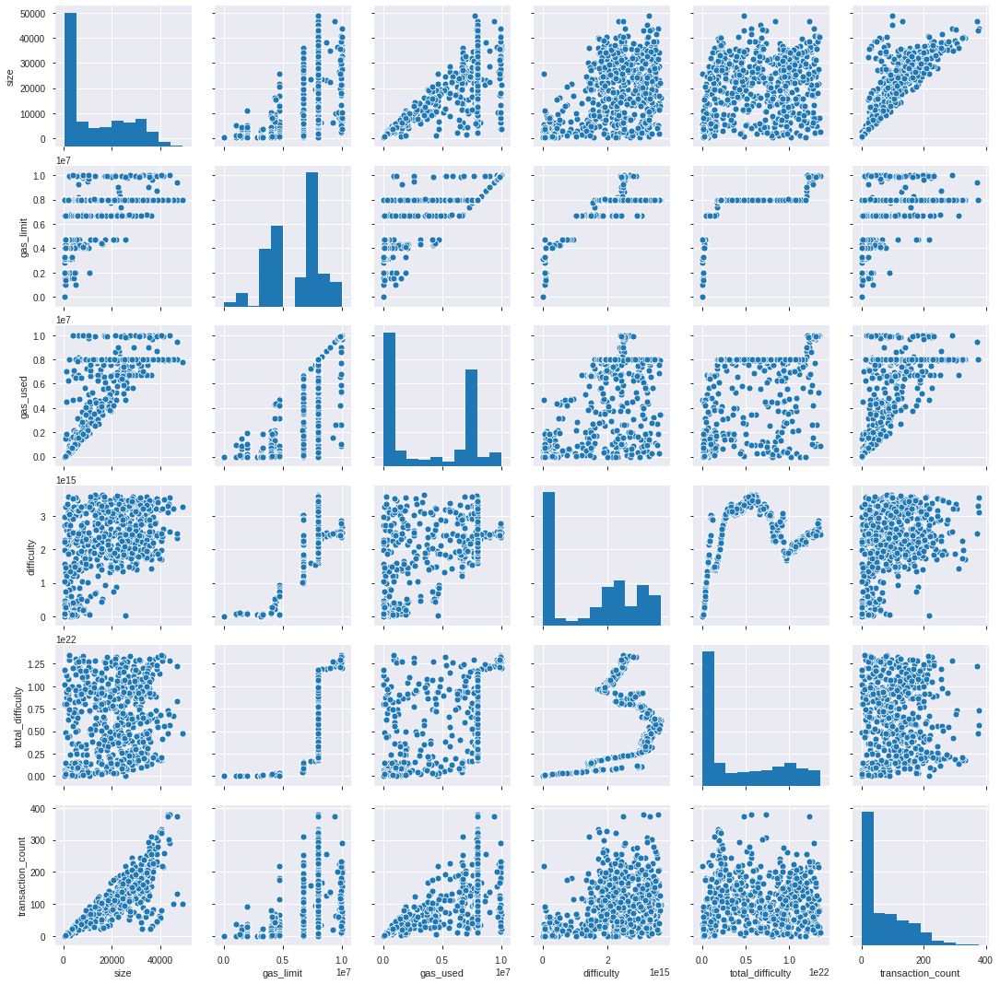

In [46]:
sns.pairplot(sample)

In [47]:
sample.corr()

,size,gas_limit,gas_used,difficulty,total_difficulty,transaction_count
size,1.000000,0.711854,0.870394,0.718451,0.571009,0.908389
gas_limit,0.711854,1.000000,0.817198,0.884763,0.815527,0.630403
gas_used,0.870394,0.817198,1.000000,0.796316,0.724982,0.770074
difficulty,0.718451,0.884763,0.796316,1.000000,0.691842,0.633170
total_difficulty,0.571009,0.815527,0.724982,0.691842,1.000000,0.455245
transaction_count,0.908389,0.630403,0.770074,0.633170,0.455245,1.000000


# Analysis

At first glance from the correlation table, you could argue there is a strong correlation between most of the variables such as size strongly correlates with both gas_used and transaction_count, gas_limit with variables gas used, difficulty and total difficulty, and lastly with gas used strongly correlates with difficulty and transaction count. However all the gas limit correlations are not linear following a logarithmic trend or the excess of many outliers as is the cas with transaction count. Gas used and difficulty has far too many outliers to really consider that there is a correlation between the data sets.

In general, it is safe to say as gas limit increases, difficulty increases. And as size increases, the number of transactions increase.

Text(0, 0.5, 'Frequency')

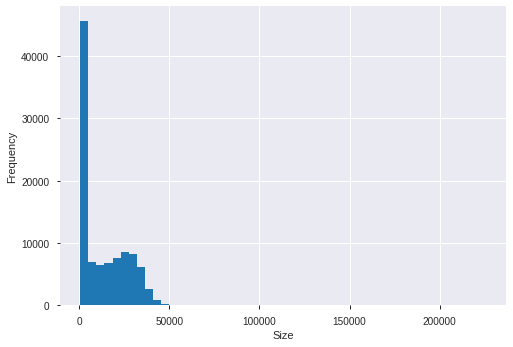

In [48]:
df['size'].hist(bins=50)
plt.xlabel('Size')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

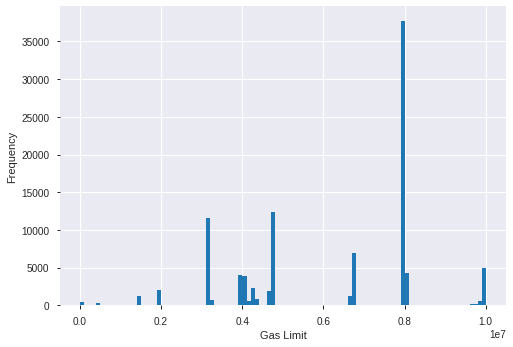

In [49]:
df['gas_limit'].hist(bins=100)
plt.xlabel('Gas Limit')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

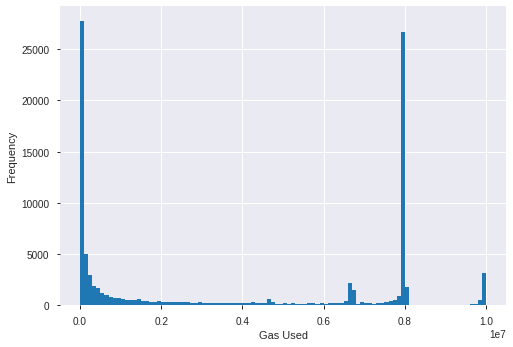

In [50]:
df['gas_used'].hist(bins=100)
plt.xlabel('Gas Used')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

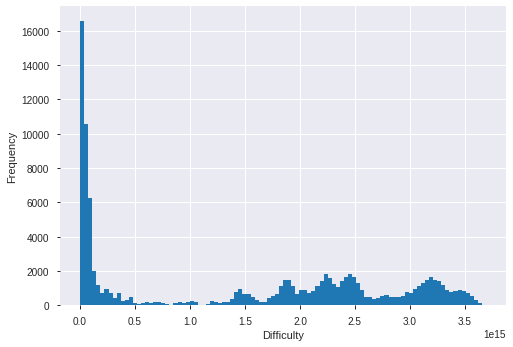

In [51]:
df['difficulty'].hist(bins=100)
plt.xlabel('Difficulty')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

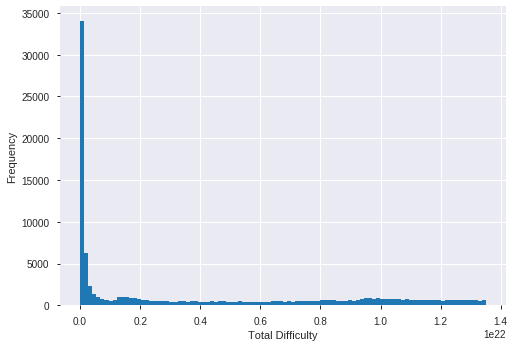

In [52]:
df['total_difficulty'].hist(bins=100)
plt.xlabel('Total Difficulty')
plt.ylabel('Frequency')

Text(0, 0.5, 'Frequency')

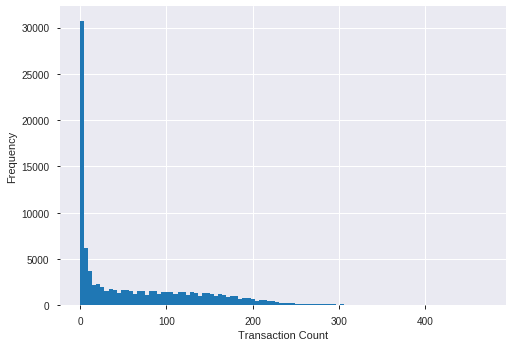

In [53]:
df['transaction_count'].hist(bins=100)
plt.xlabel('Transaction Count')
plt.ylabel('Frequency')

### Histogram analysis

With regard to the above histograms, all the histograms are postively skewed bar gas limit and maybe gas used. Size, difficulty, total difficulty and transaction count all share the same trend with many low order data points skewing postively with some outliers high value outliers. Gas limit has spurious data points and shows no clear trend. Gas used seems postively skewed but with the large spike at around $0.8\times10^7$, the dataset seems more parabolic in nature.

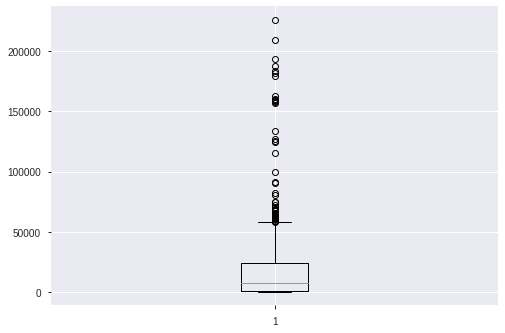

In [54]:
plt.boxplot(df['size']);

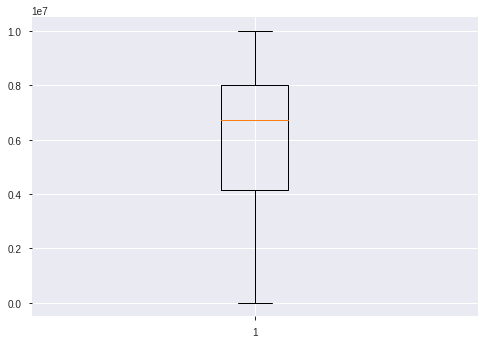

In [55]:
plt.boxplot(df['gas_limit'])
plt.show()

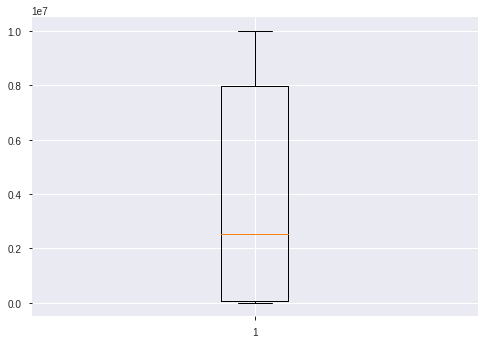

In [56]:
plt.boxplot(df['gas_used'])
plt.show()

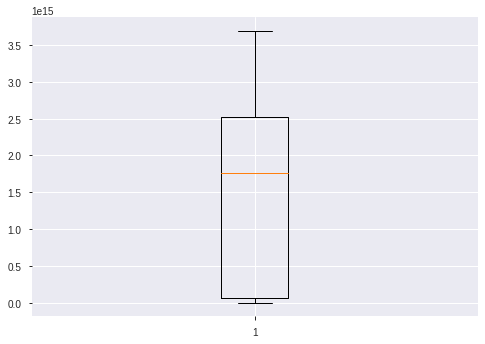

In [57]:
plt.boxplot(df['difficulty'])
plt.show()

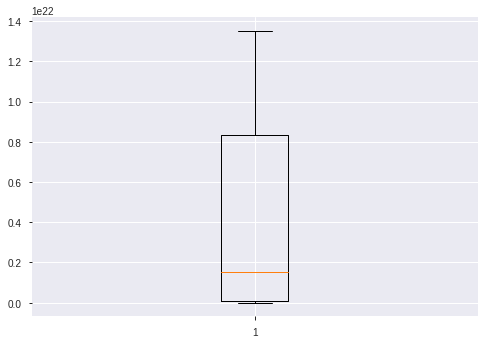

In [58]:
plt.boxplot(df['total_difficulty'])
plt.show()

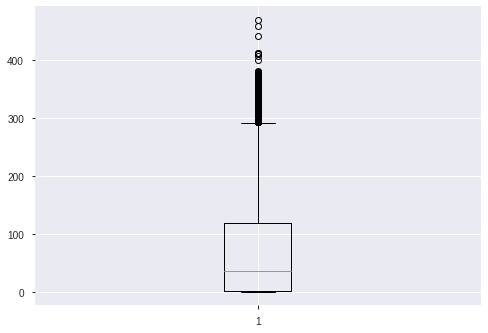

In [59]:
plt.boxplot(df['transaction_count'])
plt.show()

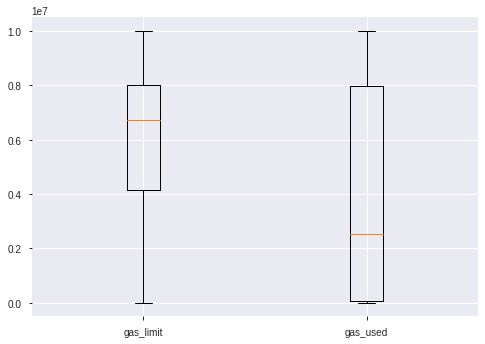

In [60]:
plt.boxplot((df['gas_limit'], df['gas_used']), labels=['gas_limit', 'gas_used']);

## Boxplot analysis

Size and transaction count both are positively skewed with a significant number of outliers. Given that these two variables are strongly correlated, it is not particularly surprising. Comparing the variables gas limit and gas used, gas used is positively skewed where as gas limit is slightly negatively skewed with no outliers in both cases.

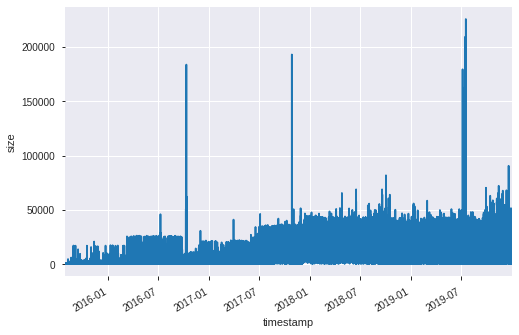

In [61]:
df['size'].plot()
plt.ylabel('size')
plt.show()

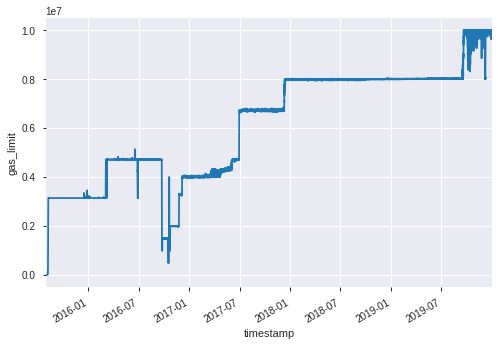

In [62]:
df['gas_limit'].plot()
plt.ylabel('gas_limit')
plt.show()

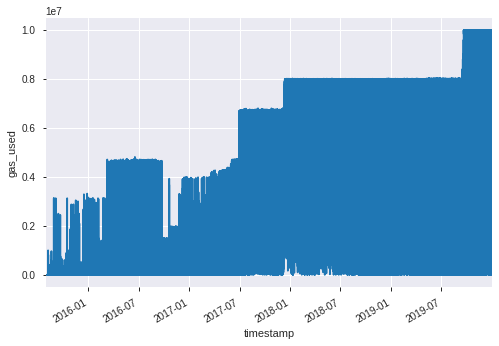

In [63]:
df['gas_used'].plot()
plt.ylabel('gas_used')
plt.show()

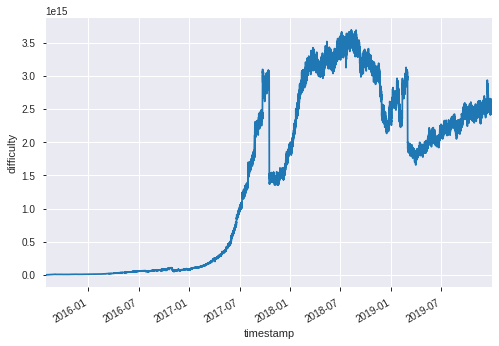

In [64]:
df['difficulty'].plot()
plt.ylabel('difficulty')
plt.show()

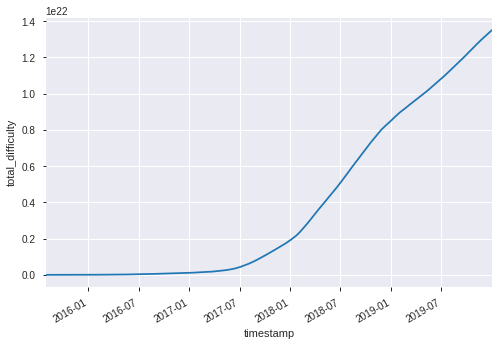

In [65]:
df['total_difficulty'].plot()
plt.ylabel('total_difficulty')
plt.show()

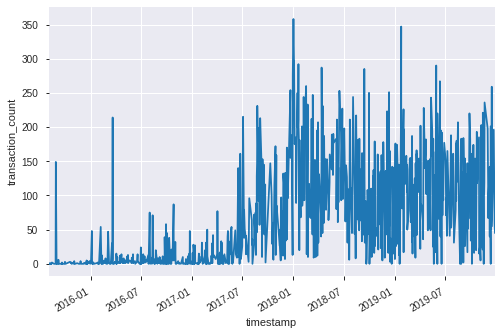

In [66]:
df['transaction_count'].sample(1000).plot()
plt.ylabel('transaction_count')
plt.show()

## Timestamp analysis

The total difficulty has steadily rose YOY, MOM since 2017. This is further corroborated with the difficulty also increasing almost exponentially in the time period Jan-2017 through to Jan-2018. The peak here coincides at the peak of the BitCoin bubble peak in January 2018 before a correction in the overall cryptocurrency market occurred soon after. There was a sharp increase in the difficulty soon after in January 2018 and peaking around July 2018. Since then the difficulty has steadily declined to $1.8\times10^{15}$ now is slowly going up again. Hence the difficulty obtaining ethereum has more or less similar to the price to bitcoin. Which suggests despite the two currencies being completely separate currencies, there is a degree of correlation between the two for market corrections and rallies.

The size of the trades have generally increased over time between 2016 to 2019 steadily increasing to around 50000 in 2019. The gas limit appears to follow a step graph trend with a steady increasing long term trend. Gas used largely follows the same trend as gas limit. The transaction count is steadily from about 50 in January 2016 to about 400 in the last quarter of 2019. 

# Overall

It can be concluded the general use of ethereum is in line with bitcoin generally speaking in terms of the difficulty to obtain new coins. More analysis would need to be done to dictate one way or the other is this true or not. It can be said confidently though that the overall value, trade volume and trasactions associated with Ethereum are on an upward trend. The underlying price of the coin is difficult to predict based on this analysis however, the back half of 2019 has ethereum steadily increasing in price after the market correction to the underlying price in 2018.